# Visium (Spatial transcriptomics)

## Data download

The 10X Visium slides from the human heart can be downloaded here: https://zenodo.org/record/6580069
        
For this workshop we will use one slide with deconvoluted cell types which can be downloaded from GoogleDrive:
https://drive.google.com/drive/folders/1y_-TyG4O-9ii2pk8Nw2ySwQm1eNQlg3S


In [1]:
import sys
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import os
import gc
import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sns

# silence scanpy that prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Load the Visium data with deconvoluted spots
adata = sc.read_h5ad("Visium_Heart_deconvoluted.h5ad")

In [3]:
adata.obs

,in_tissue,array_row,array_col,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,...,Ischemic Mononuclear Phagocytes,Ischemic Mural cells,Ischemic Neuronal cells,Lymphatic EC,Lymphocytes,Mast cells,Monocytes,Neuronal,Pericytes,VSMC
AAACAAGTATCTCCCA-1,in_tissue,array_row,array_col,in_tissue,array_row,array_col,Visium_3_CK281,1246,7.128496,5543.0,...,0.002405,0.003795,0.007277,0.006005,0.014140,0.003576,0.001949,0.002317,0.003676,0.002003
AAACAGTGTTCCTGGG-1,in_tissue,array_row,array_col,in_tissue,array_row,array_col,Visium_3_CK281,1237,7.121252,3232.0,...,0.004952,0.003934,0.009420,0.094672,0.025863,0.005897,0.048821,0.002956,0.474071,0.007228
AAACATTTCCCGGATT-1,in_tissue,array_row,array_col,in_tissue,array_row,array_col,Visium_3_CK281,1704,7.441320,6820.0,...,0.002538,0.003169,0.008414,0.006185,0.023492,0.003166,0.001258,0.010621,0.005747,0.002997
AAACCCGAACGAAATC-1,in_tissue,array_row,array_col,in_tissue,array_row,array_col,Visium_3_CK281,1694,7.435438,7160.0,...,0.004823,0.003344,0.018820,0.013975,0.011866,0.013916,0.004623,0.018417,0.023157,0.003103
AAACCGGAAATGTTAA-1,in_tissue,array_row,array_col,in_tissue,array_row,array_col,Visium_3_CK281,1982,7.592366,6005.0,...,0.012502,0.002507,0.023903,0.009411,0.516018,0.014906,1.525833,0.002669,0.008464,0.003199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,in_tissue,array_row,array_col,in_tissue,array_row,array_col,Visium_3_CK281,1418,7.257708,3668.0,...,0.015902,0.027809,0.017896,0.010795,0.028182,0.046085,0.068390,0.079754,0.310893,0.012523
TTGTTTCACATCCAGG-1,in_tissue,array_row,array_col,in_tissue,array_row,array_col,Visium_3_CK281,1241,7.124478,3312.0,...,0.009917,0.010831,0.017016,0.004949,0.047148,0.008335,0.074042,0.008782,0.025877,0.097852
TTGTTTCATTAGTCTA-1,in_tissue,array_row,array_col,in_tissue,array_row,array_col,Visium_3_CK281,1224,7.110696,4086.0,...,0.002135,0.003058,0.005554,0.000851,0.004211,0.001203,0.002757,0.002080,0.013754,0.001459
TTGTTTCCATACAACT-1,in_tissue,array_row,array_col,in_tissue,array_row,array_col,Visium_3_CK281,1450,7.280008,3949.0,...,0.007829,0.013809,0.014305,0.005990,0.006110,0.004051,0.004691,0.005055,0.027493,0.149915


In [4]:
# Remove mitochondria-encoded (MT) genes
adata.var['mt'] = [gene.startswith('MT-') for gene in adata.var.index]
adata = adata[:, ~adata.var['mt'].values]

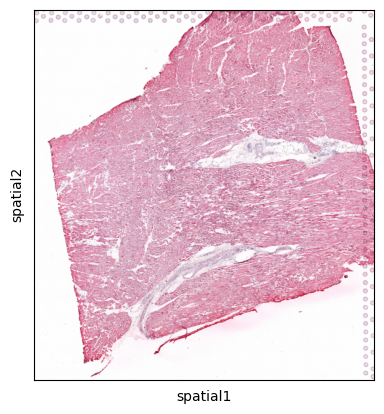

In [5]:
sc.pl.spatial(adata)

<AxesSubplot: xlabel='n_genes_by_counts'>

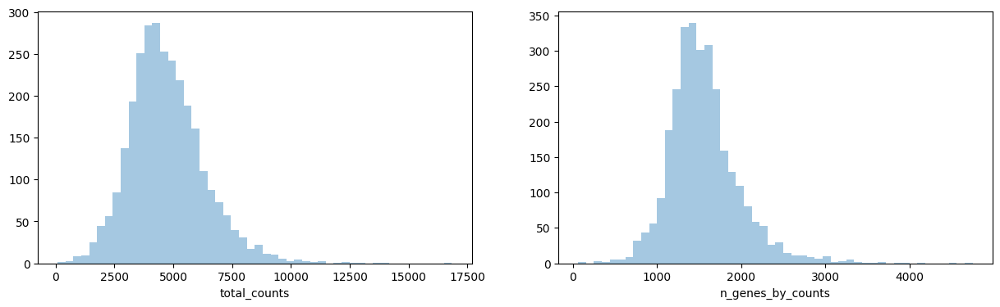

In [6]:
fig, axs = plt.subplots(1, 2, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, ax=axs[1])


## Data processing

In [7]:
# Filter genes and cells with at least 10 counts
sc.pp.filter_genes(adata, min_counts=10)
sc.pp.filter_cells(adata,min_counts=10)

In [8]:
# Store the raw data
adata.raw = adata

In [9]:
# Normalization data
sc.pp.normalize_total(adata)

In [10]:
sc.pp.log1p(adata)

In [11]:
sc.tl.pca(adata, svd_solver='arpack')

In [12]:
sc.pp.neighbors(adata,n_neighbors=25,use_rep='X_pca',random_state=0)

In [13]:
sc.tl.leiden(adata, resolution=0.8)

In [14]:
sc.tl.umap(adata)

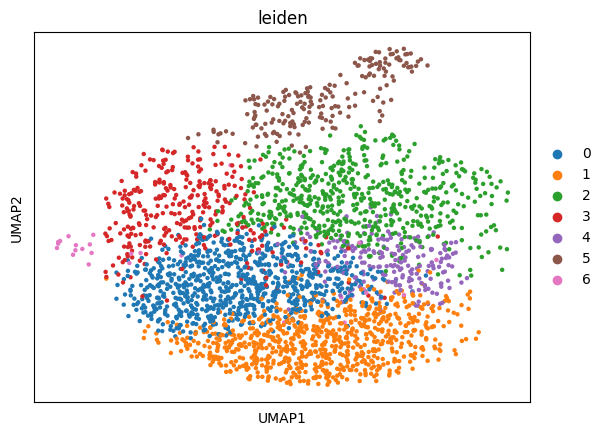

In [15]:
sc.pl.umap(adata, color=['leiden'])

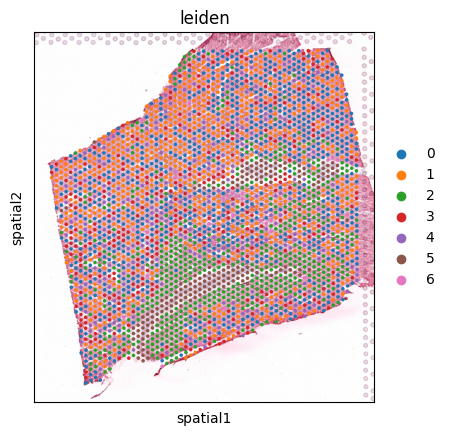

In [16]:
sc.pl.spatial(
    adata,
    color=['leiden'],)

In [17]:
adata.obs["leiden"].value_counts()

leiden
0    818
1    790
2    584
3    315
4    215
5    185
6     29
Name: count, dtype: int64

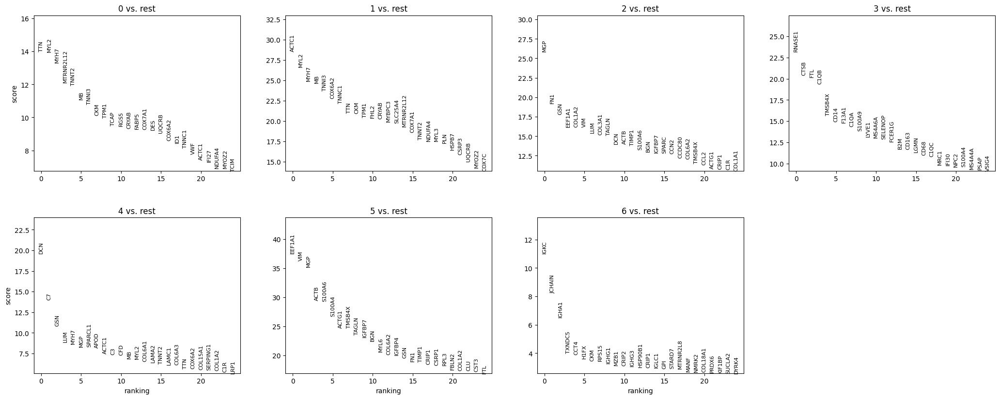

In [18]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [19]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6
0,TTN,ACTC1,MGP,RNASE1,DCN,EEF1A1,IGKC
1,MYL2,MYL2,FN1,CTSB,C7,VIM,JCHAIN
2,MYH7,MYH7,GSN,FTL,GSN,MGP,IGHA1
3,MTRNR2L12,MB,EEF1A1,C1QB,LUM,ACTB,TXNDC5
4,TNNT2,TNNI3,COL1A2,TMSB4X,MYH7,S100A6,CCT4


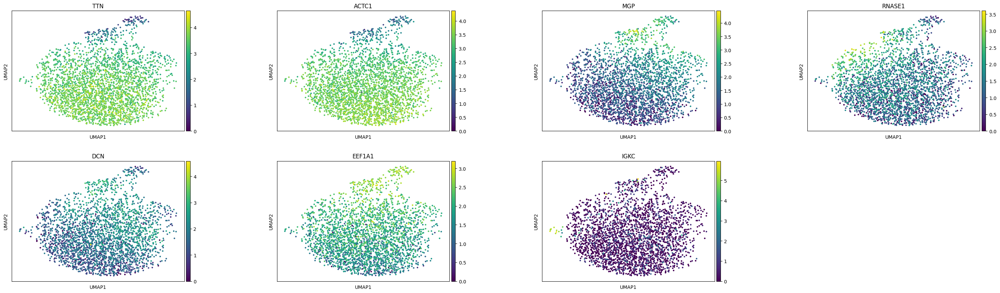

In [20]:
marker = adata.uns['rank_genes_groups']['names'][0]
sc.pl.umap(
    adata,
    color=marker,
    wspace=0.4,
)

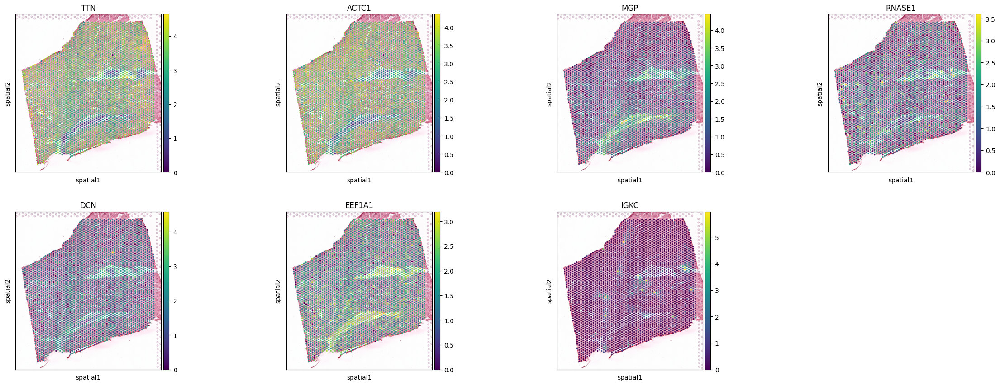

In [21]:
sc.pl.spatial(
    adata,
    color=marker,
    use_raw=False,)

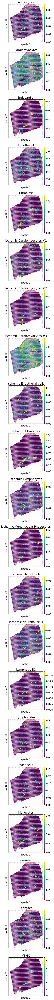

In [22]:
cell_types = list(adata.obs.columns[(adata.obs.columns.get_loc("Adipocytes")):adata.obs.columns.get_loc("VSMC")+1])
with mpl.rc_context({'axes.facecolor':  'white',
                     "font.size" : 16,
                     'figure.figsize': [4.5, 5]}):

        sc.pl.spatial(adata, cmap='viridis',
                  # show first 8 cell types
                  color=cell_types,
                  ncols=1, size=1.3,
                  img_key='hires', vmin=0, vmax='p99')

In [23]:
cols_to_include = ["leiden"] + list(adata.obs.columns[(adata.obs.columns.get_loc("Adipocytes")):adata.obs.columns.get_loc("VSMC")+1])
cell_type_clustering =adata.obs.loc[:, cols_to_include]

In [24]:
melted_df = cell_type_clustering.melt(id_vars=['leiden'], var_name='cell_type', value_name='abundance')

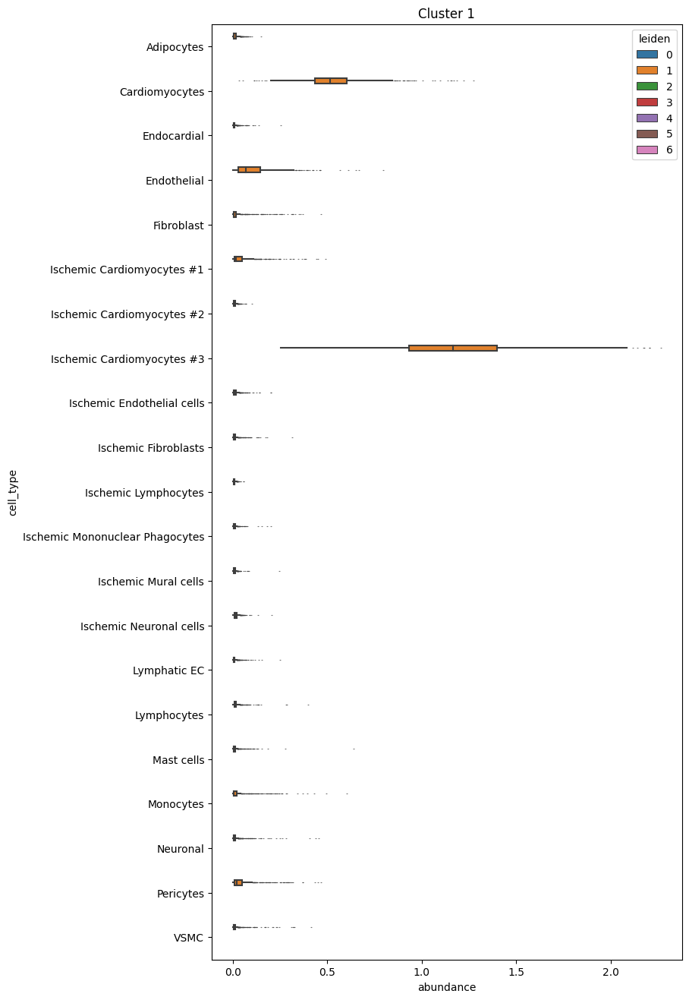

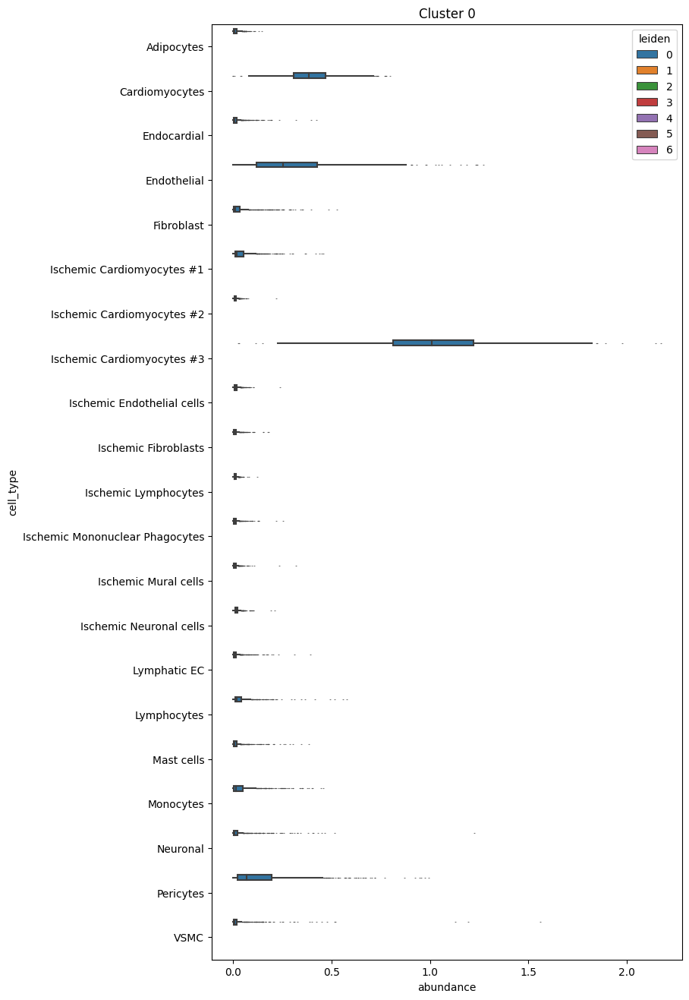

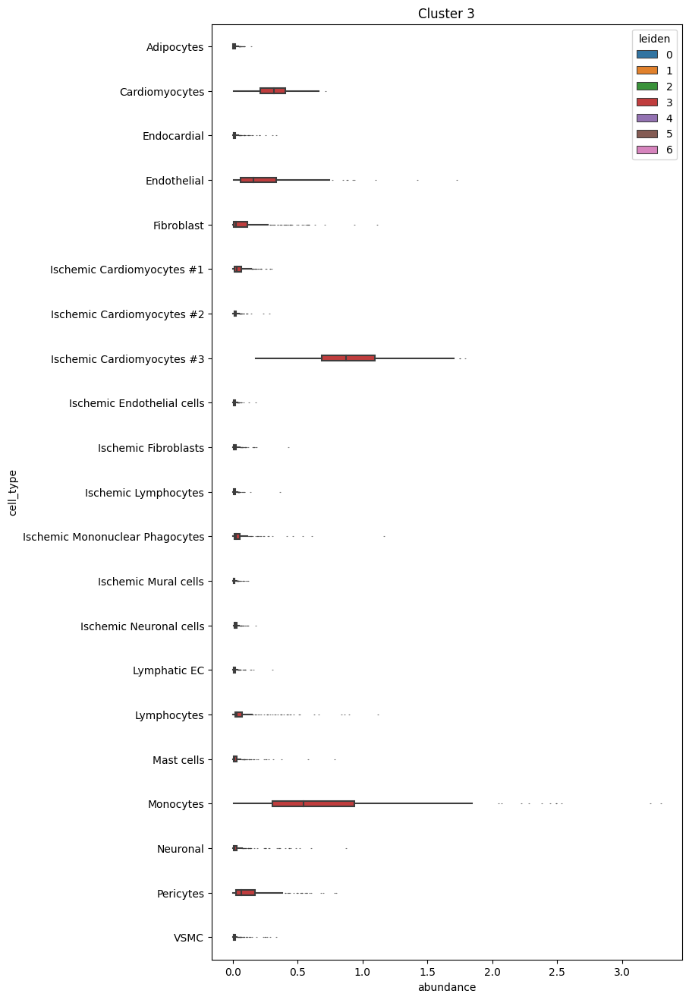

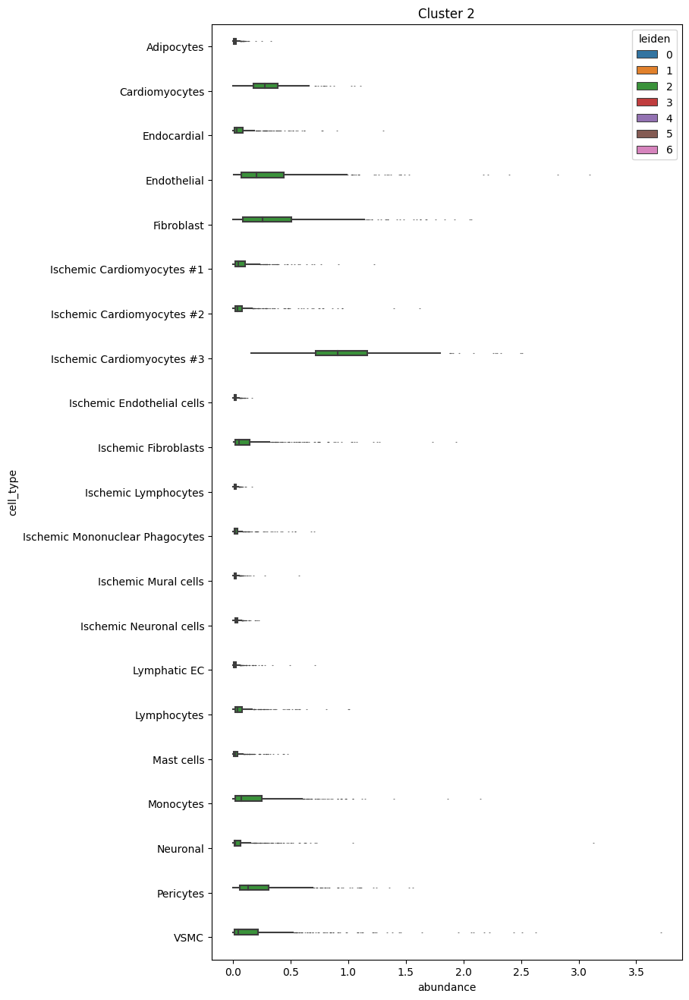

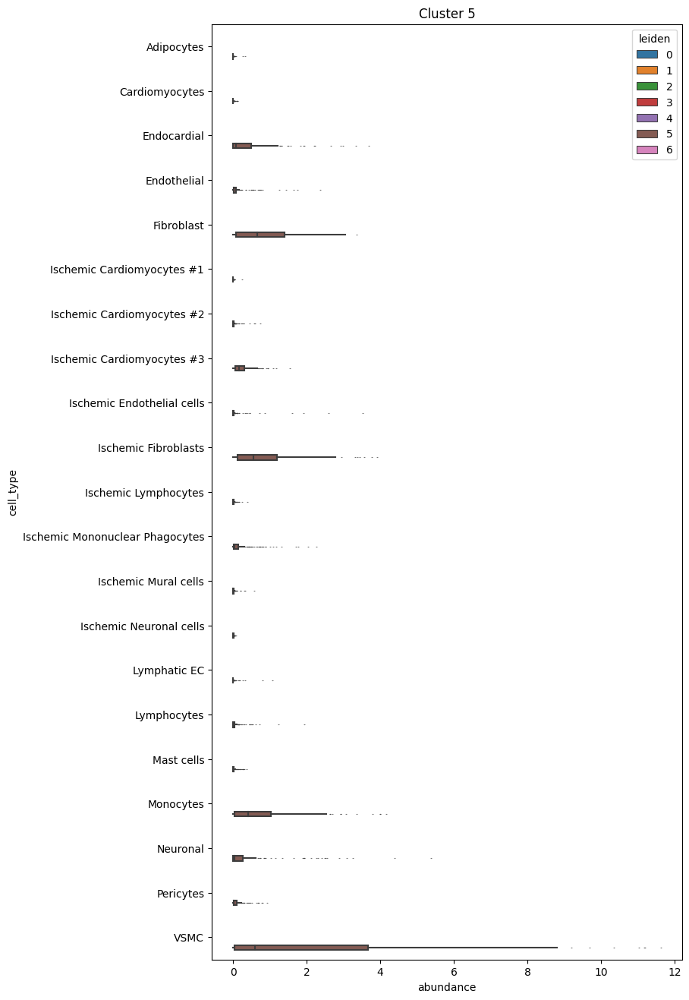

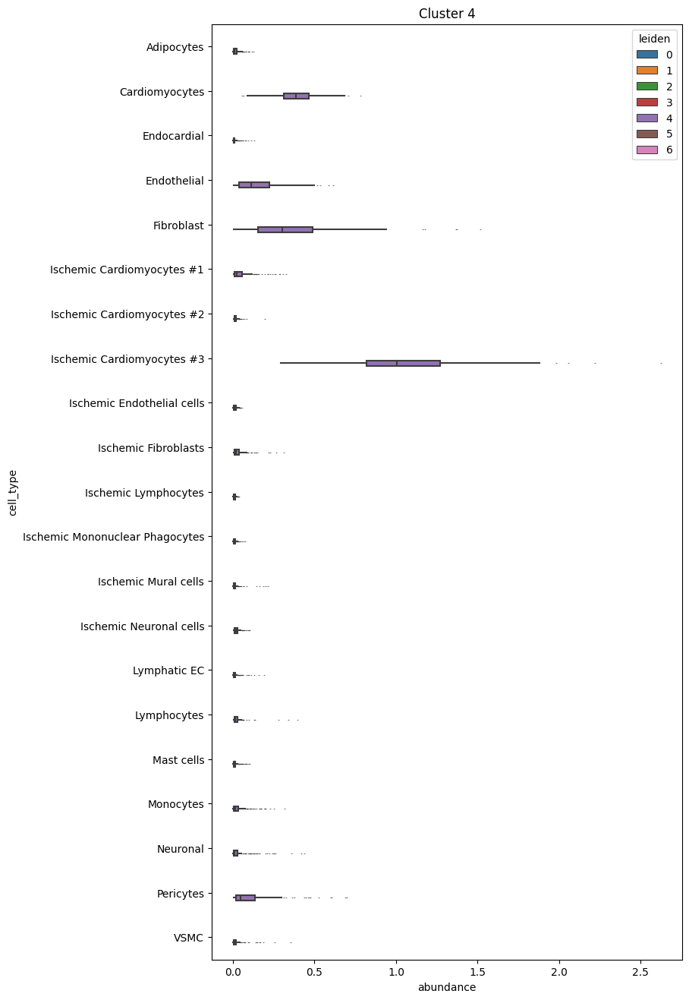

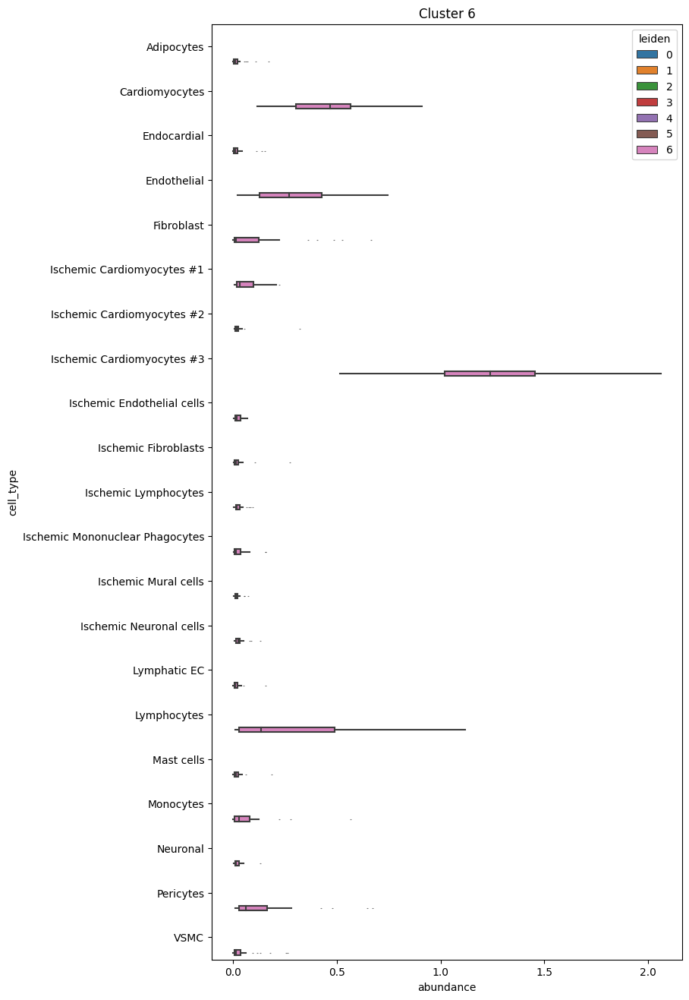

In [25]:
melted_df["log"] = np.log2(melted_df["abundance"]+0.1)

rcParams['figure.figsize'] = 8,16

for i, s in enumerate(adata.obs['leiden'].unique()):
    tmp = melted_df[melted_df.leiden==s]
    sns.boxplot(y='cell_type', x='abundance', hue='leiden', fliersize=0.2, showcaps=False, data=tmp).set(title='Cluster '+s)
    #plt.xticks(rotation=90)
    plt.show()